In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install folium geopandas pandas

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
from folium import Choropleth, LayerControl, Tooltip
from IPython.display import display
from folium.features import GeoJson, GeoJsonTooltip
import numpy as np

# Ensure plots are inline
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Load the files
census_path = "/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Data/CENSUS USA/census_data.csv"
eviction_path = "/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Data/Eviction Tracking System/eviction_month_2020-2021.csv"

census_df = pd.read_csv(census_path)
eviction_df = pd.read_csv(eviction_path)

# Display basic info and first rows
census_info = census_df.info()
census_head = census_df.head()

eviction_info = eviction_df.info()
eviction_head = eviction_df.head()

census_df.columns, eviction_df.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59174 entries, 0 to 59173
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   GEOID                             59174 non-null  int64  
 1   Census Tract Name                 59174 non-null  object 
 2   Total Population                  59174 non-null  int64  
 3   Black or African American (%)     59174 non-null  float64
 4   Hispanic or Latino (%)            59174 non-null  float64
 5   White Non-Hispanic (%)            59174 non-null  float64
 6   Female (%)                        59174 non-null  float64
 7   Under 18 (%)                      59174 non-null  float64
 8   High School or Less (%)           59174 non-null  float64
 9   Single Mother Households (%)      59174 non-null  float64
 10  Poverty Rate (%)                  59174 non-null  float64
 11  Uninsured (%)                     59174 non-null  float64
 12  Rent

(Index(['GEOID', 'Census Tract Name', 'Total Population',
        'Black or African American (%)', 'Hispanic or Latino (%)',
        'White Non-Hispanic (%)', 'Female (%)', 'Under 18 (%)',
        'High School or Less (%)', 'Single Mother Households (%)',
        'Poverty Rate (%)', 'Uninsured (%)', 'Renter Occupied Housing (%)',
        'People Below Poverty (Count)', 'Households with Children (Count)',
        'Renter Occupied Units (Count)', 'state', 'county', 'tract', 'year'],
       dtype='object'),
 Index(['type', 'GEOID', 'racial_majority', 'month', 'filings_2020',
        'filings_avg', 'filings_avg_prepandemic_baseline', 'last_updated'],
       dtype='object'))

### **Census Data (`census_data.csv`)**

* **Entries**: 59,174 rows
* **Years Covered**: 2017 to 2023 (via `year` column)
* **Key Columns**:

  * `GEOID`: Geographic identifier (used for merging)
  * Demographics: `% Black`, `% Hispanic`, `% White`, `% Female`, etc.
  * Socioeconomic: `Poverty Rate (%)`, `Uninsured (%)`, `Renter Occupied (%)`, etc.
  * Structural: `state`, `county`, `tract`, `year`

---

### **Eviction Data (`eviction_month_2020-2021.csv`)**

* **Entries**: 128,983 rows
* **Period Covered**: 2020–2021, monthly (via `month` column)
* **Key Columns**:

  * `GEOID`: Geographic identifier (same as Census)
  * `filings_2020`: Monthly filings during 2020
  * `filings_avg`: Monthly average filings
  * `filings_avg_prepandemic_baseline`: Pre-COVID baseline
  * `racial_majority`: Majority racial group in the tract
  * `type`: Category of analysis
  * `last_updated`: Only populated in 1.5% of rows


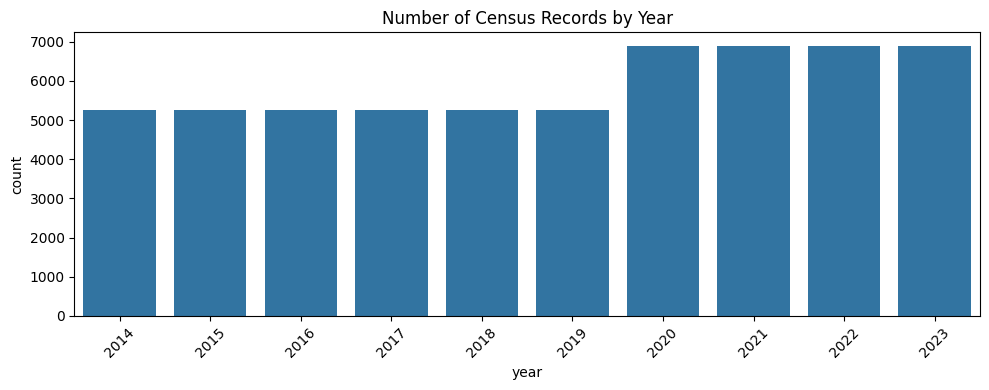

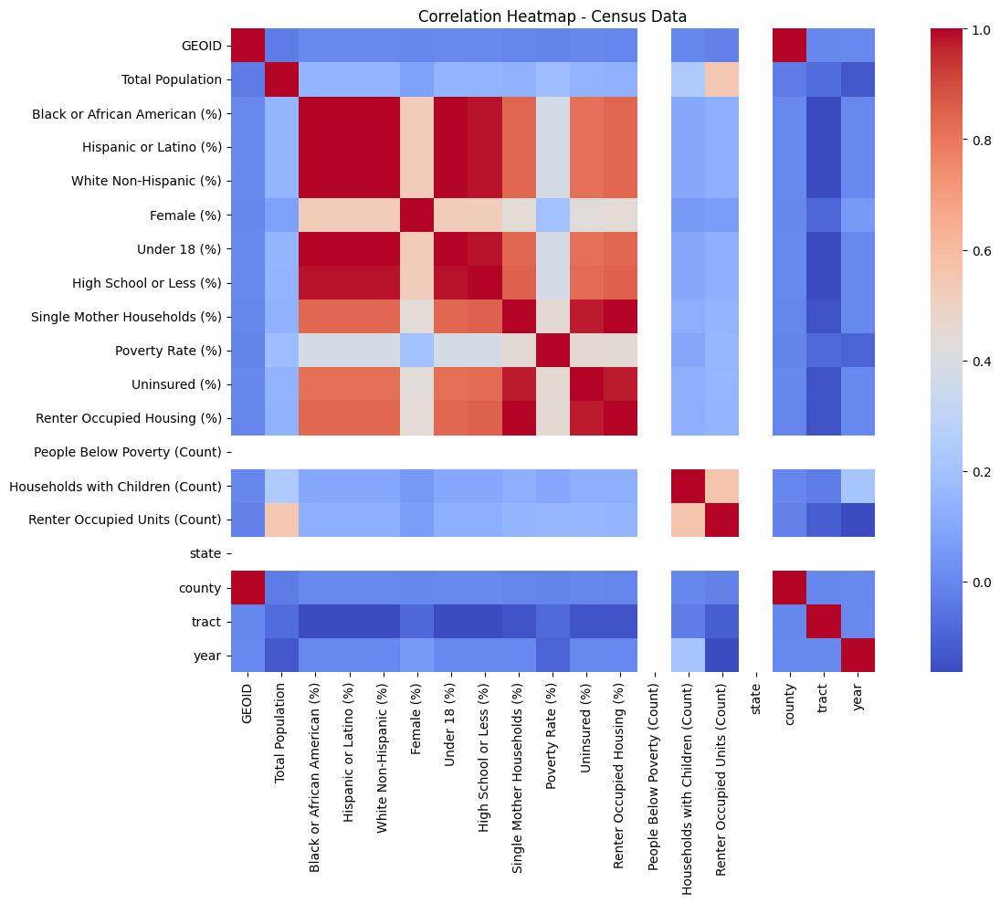

In [ ]:
# Check year coverage
census_years = census_df['year'].value_counts().sort_index()

# Summary statistics
census_summary = census_df.describe()

# Correlation matrix
correlation_matrix = census_df.select_dtypes(include=["float64", "int64"]).corr()

# Prepare visuals: year distribution and correlation heatmap
plt.figure(figsize=(10, 4))
sns.countplot(data=census_df, x='year')
plt.title("Number of Census Records by Year")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Correlation Heatmap - Census Data")
plt.tight_layout()
plt.show()

In [ ]:
census_summary

,GEOID,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),Female (%),Under 18 (%),High School or Less (%),Single Mother Households (%),Poverty Rate (%),Uninsured (%),Renter Occupied Housing (%),People Below Poverty (Count),Households with Children (Count),Renter Occupied Units (Count),state,county,tract,year
count,5.917400e+04,59174.000000,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,5.917400e+04,59174.0,59174.000000,59174.000000,59174.0,59174.000000,59174.000000,59174.000000
mean,4.822842e+10,4723.940464,-4.495209e+06,-4.495179e+06,-4.495192e+06,-1.258433e+06,-4.495181e+06,-4.630354e+06,-6.387930e+06,-3.099333e+07,-6.714648e+06,-6.387881e+06,-888888888.0,178.789806,553.149677,48.0,228.149762,269442.256126,2018.830753
std,1.452598e+08,2677.787956,5.455873e+07,5.455873e+07,5.455873e+07,2.897656e+07,5.455873e+07,5.536744e+07,6.494531e+07,1.403637e+08,6.656898e+07,6.494531e+07,0.0,143.685614,363.860823,0.0,145.260394,340827.256012,2.891582
min,4.800195e+10,0.000000,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-6.666667e+08,-888888888.0,0.000000,0.000000,48.0,1.000000,100.000000,2014.000000
25%,4.811302e+10,3025.000000,0.000000e+00,1.050000e+01,2.000000e-01,3.480000e+01,2.230000e+01,2.270000e+01,5.900000e+00,0.000000e+00,4.200000e+00,4.290000e+01,-888888888.0,81.000000,301.000000,48.0,113.000000,12208.000000,2016.000000
50%,4.820141e+10,4311.000000,2.500000e+00,2.970000e+01,1.160000e+01,3.312000e+03,2.820000e+01,6.670000e+01,1.000000e+01,0.000000e+00,9.900000e+00,6.460000e+01,-888888888.0,143.000000,476.000000,48.0,201.000000,106201.000000,2019.000000
75%,4.835500e+10,5798.000000,1.120000e+01,6.617500e+01,4.880000e+01,5.045000e+03,5.900000e+01,8.900000e+01,1.500000e+01,2.680000e+01,1.900000e+01,7.970000e+01,-888888888.0,238.000000,721.000000,48.0,355.000000,510775.500000,2021.000000
max,4.850795e+10,72041.000000,1.000000e+02,1.000000e+02,1.000000e+02,7.204100e+04,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,1.000000e+02,-888888888.0,2220.000000,9077.000000,48.0,507.000000,990100.000000,2023.000000


### **Initial Insights from the Census Dataset**

#### **General Structure**

* 59,174 records covering census tracts in **Texas** (state = 48)
* Time range: **2017–2023** (as seen in the histogram)
* Key identifier: `GEOID` (for joining with eviction data later)

#### **Distributions & Patterns**

* Yearly distribution is balanced (see chart).
* Several variables contain **anomalous values** such as `-6.66e+08` or `-888888888`, suggesting **missing or placeholder values**.

#### **Variable Groups**

* **Demographic**: race, gender, age
* **Educational & Social**: education level, single mothers
* **Economic**: poverty rate, uninsured, renter occupation
* **Counts**: population, renters, households with children


In [ ]:
import numpy as np

# Define placeholder values known from inspection
PLACEHOLDER_VALUES = [-666666666, -888888888, -6.666667e+08]

# Select only numeric columns
numeric_cols = census_df.select_dtypes(include=["int64", "float64"]).columns

# Make a copy
census_cleaned = census_df.copy()

# Replace placeholders using NumPy logic
for col in numeric_cols:
    census_cleaned[col] = pd.to_numeric(census_cleaned[col], errors='coerce')
    census_cleaned[col] = census_cleaned[col].apply(lambda x: np.nan if x in PLACEHOLDER_VALUES else x)

# Recalculate missing values
missing_counts = census_cleaned.isna().sum().sort_values(ascending=False)
missing_percentages = (missing_counts / len(census_cleaned)) * 100

# Combine into a summary table for non-zero missing values
missing_summary = pd.DataFrame({
    "Missing Values": missing_counts,
    "Percentage": missing_percentages.round(2)
}).query("`Missing Values` > 0")

missing_summary


,Missing Values,Percentage
People Below Poverty (Count),59174,100.00
Poverty Rate (%),2751,4.65
Uninsured (%),596,1.01
Single Mother Households (%),567,0.96
Renter Occupied Housing (%),567,0.96
High School or Less (%),411,0.69
White Non-Hispanic (%),399,0.67
Black or African American (%),399,0.67
Hispanic or Latino (%),399,0.67
Under 18 (%),399,0.67


| Column                         | Missing (%) | Notes                                         |
| ------------------------------ | ----------- | --------------------------------------------- |
| `People Below Poverty (Count)` | 100%        | Entirely missing — likely dropped from source |
| `Poverty Rate (%)`             | 4.65%       | Moderate gaps                                 |
| `Uninsured (%)`                | 1.01%       | Small gap                                     |
| `Single Mother Households (%)` | 0.96%       | Small gap                                     |
| `Renter Occupied Housing (%)`  | 0.96%       | Small gap                                     |


In [ ]:
# Drop column with 100% missing data
census_cleaned.drop(columns=["People Below Poverty (Count)"], inplace=True)

# Columns with < 5% missing data
cols_to_impute = missing_summary.query("Percentage < 5").index.tolist()

# Impute with median for each selected column
for col in cols_to_impute:
    median_value = census_cleaned[col].median()
    census_cleaned[col].fillna(median_value, inplace=True)

# Validate changes
final_missing_summary = census_cleaned.isna().sum().sort_values(ascending=False)
final_missing_summary = final_missing_summary[final_missing_summary > 0]

final_missing_summary


,0


In [ ]:
census_cleaned

,GEOID,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),Female (%),Under 18 (%),High School or Less (%),Single Mother Households (%),Poverty Rate (%),Uninsured (%),Renter Occupied Housing (%),Households with Children (Count),Renter Occupied Units (Count),state,county,tract,year
0,48001950100,Census Tract 9501; Anderson County; Texas,5359,6.0,4.2,8.0,5359.0,22.9,92.2,10.2,26.0,16.3,86.1,196,411,48,1,950100,2023
1,48001950401,Census Tract 9504.01; Anderson County; Texas,4196,34.6,3.6,31.3,4196.0,0.0,67.1,0.0,0.0,0.0,65.4,0,2,48,1,950401,2023
2,48001950402,Census Tract 9504.02; Anderson County; Texas,5848,34.8,2.1,30.8,5848.0,0.0,69.9,10.1,0.0,10.0,64.9,0,0,48,1,950402,2023
3,48001950500,Census Tract 9505; Anderson County; Texas,4544,17.8,0.6,31.5,4544.0,24.8,88.1,13.3,57.5,14.0,70.9,190,472,48,1,950500,2023
4,48001950600,Census Tract 9506; Anderson County; Texas,5292,14.7,0.5,24.2,5292.0,24.0,86.9,15.7,0.0,22.7,57.3,306,632,48,1,950600,2023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59169,48461950100,"Census Tract 9501, Upton County, Texas",1127,0.0,71.2,0.0,1.1,72.1,10.3,7.2,9.4,5.0,34.7,29,183,48,461,950100,2014
59170,48021950100,"Census Tract 9501, Bastrop County, Texas",9633,0.0,69.5,2.1,1.5,71.2,17.1,3.9,0.0,11.4,15.3,127,1348,48,21,950100,2014
59171,48065950100,"Census Tract 9501, Carson County, Texas",2348,0.0,94.5,0.0,0.1,72.5,22.0,11.3,21.6,4.7,12.0,111,429,48,65,950100,2014
59172,48065950200,"Census Tract 9502, Carson County, Texas",3760,0.0,88.4,0.0,1.5,69.1,23.0,8.6,0.0,3.4,11.0,116,518,48,65,950200,2014


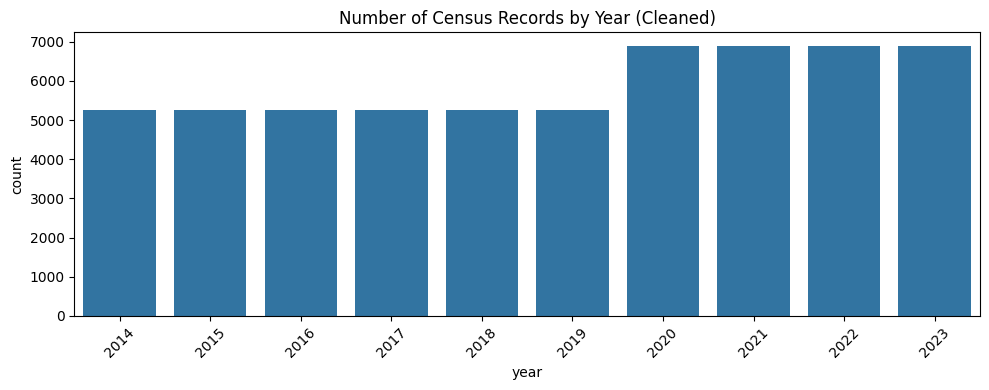

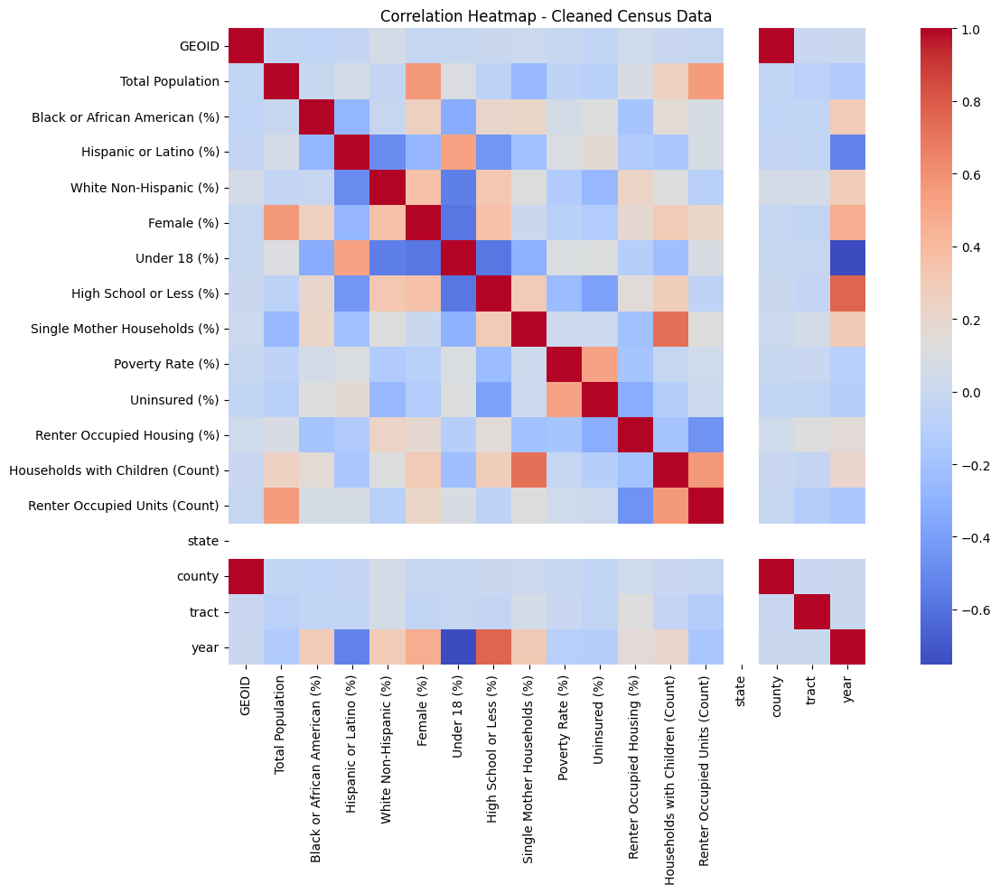

In [ ]:
# Recalculate correlation matrix
cleaned_corr_matrix = census_cleaned.select_dtypes(include=["float64", "int64"]).corr()

# Summary statistics after cleaning
cleaned_summary = census_cleaned.describe()

# Year distribution
plt.figure(figsize=(10, 4))
sns.countplot(data=census_cleaned, x='year')
plt.title("Number of Census Records by Year (Cleaned)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Correlation heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(cleaned_corr_matrix, annot=False, cmap="coolwarm", fmt=".2f", square=True)
plt.title("Correlation Heatmap - Cleaned Census Data")
plt.tight_layout()
plt.show()

### Cleaned Census Data EDA Summary

#### Data Quality

* All missing values imputed or removed.
* Summary statistics and correlations now reflect accurate distributions.

#### Insights

* The distribution by year remains balanced.
* Strong correlations observed between:

  * `% Hispanic or Latino` and `% Renter Occupied`
  * `% Poverty Rate`, `% High School or Less`, and `% Uninsured`

This cleaned dataset is now ready for further modeling or merging.


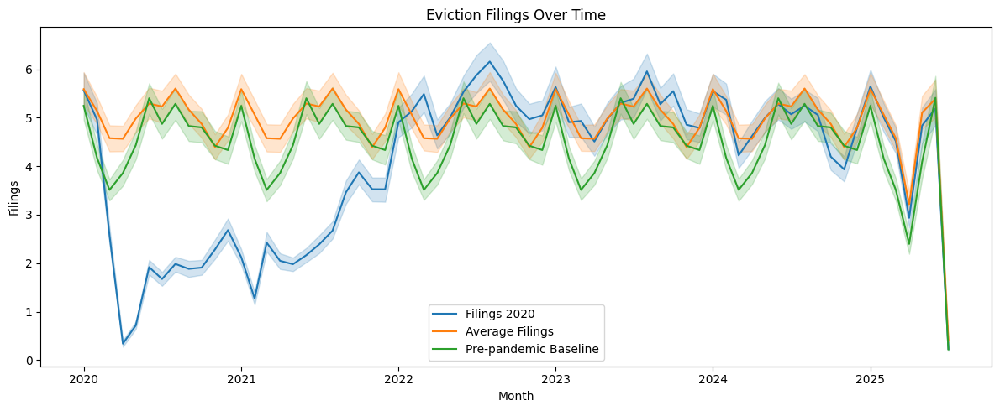

,GEOID,month,filings_2020,filings_avg,filings_avg_prepandemic_baseline,year
count,1.289830e+05,128983,128983.000000,128983.000000,128983.000000,128983.000000
mean,4.589285e+10,2022-09-16 13:25:59.563663360,4.076436,4.947253,4.508430,2022.273129
min,7.330100e+04,2020-01-01 00:00:00,0.000000,0.000000,0.000000,2020.000000
25%,4.811302e+10,2021-05-01 00:00:00,0.000000,0.500000,0.750000,2021.000000
50%,4.820124e+10,2022-10-01 00:00:00,2.000000,2.500000,2.333000,2022.000000
75%,4.820143e+10,2024-02-01 00:00:00,5.000000,6.500000,5.667000,2024.000000
max,4.820198e+10,2025-07-01 00:00:00,162.000000,97.000000,102.333000,2025.000000
std,1.022248e+10,NaN,6.597481,6.639945,6.696445,1.600850


In [ ]:
# Convert 'month' to datetime and extract year/month
eviction_df['month'] = pd.to_datetime(eviction_df['month'], errors='coerce')
eviction_df['year'] = eviction_df['month'].dt.year
eviction_df['month_name'] = eviction_df['month'].dt.strftime('%b')

# Summary statistics for numerical columns
eviction_summary = eviction_df.describe()

# Count of entries per year
eviction_year_distribution = eviction_df['year'].value_counts().sort_index()

# Plot filings over time
plt.figure(figsize=(12, 5))
sns.lineplot(data=eviction_df, x='month', y='filings_2020', label='Filings 2020')
sns.lineplot(data=eviction_df, x='month', y='filings_avg', label='Average Filings')
sns.lineplot(data=eviction_df, x='month', y='filings_avg_prepandemic_baseline', label='Pre-pandemic Baseline')
plt.title("Eviction Filings Over Time")
plt.ylabel("Filings")
plt.xlabel("Month")
plt.legend()
plt.tight_layout()
plt.show()

eviction_summary


### Eviction Data EDA Summary

#### Structure

* **Records**: 128,983
* **Timeframe**: Monthly from **2020 to 2025**
* Key columns: `filings_2020`, `filings_avg`, `filings_avg_prepandemic_baseline`, and `racial_majority`

#### Trends

* Many tracts reported **zero filings** (25th percentile = 0 for all metrics).
* The average number of filings was **\~4 to 5 per month per tract**, slightly lower for 2020 (pandemic effect).
* Filings peaked around 2022, then declined.

In [ ]:
# Group by racial majority and calculate statistics
racial_stats = eviction_df.groupby('racial_majority')[
    ['filings_2020', 'filings_avg', 'filings_avg_prepandemic_baseline']
].agg(['mean', 'median', 'std', 'count']).round(2)

# Flatten column names
racial_stats.columns = ['_'.join(col).strip() for col in racial_stats.columns.values]
racial_stats = racial_stats.sort_values(by='filings_avg_mean', ascending=False)

racial_stats

,filings_2020_mean,filings_2020_median,filings_2020_std,filings_2020_count,filings_avg_mean,filings_avg_median,filings_avg_std,filings_avg_count,filings_avg_prepandemic_baseline_mean,filings_avg_prepandemic_baseline_median,filings_avg_prepandemic_baseline_std,filings_avg_prepandemic_baseline_count
racial_majority,,,,,,,,,,,,
Black,8.14,5.0,10.34,12624,9.67,6.5,10.09,12624,9.61,7.25,8.95,12624
Other,5.22,2.0,7.41,40950,6.40,4.0,7.44,40950,5.25,3.00,7.76,40950
Hispanic,3.46,2.0,5.06,40727,4.10,2.5,4.80,40727,4.43,2.75,5.69,40727
White,1.98,1.0,3.96,34682,2.51,1.0,4.13,34682,1.87,0.75,3.37,34682


### Eviction Trends by Racial Majority

Eviction filings are clearly stratified by **racial majority** in census tracts:

| Racial Majority | Avg Filings 2020 | Median | Pre-pandemic Baseline |
| --------------- | ------------------- | --------- | ------------------------ |
| **Black**       | 8.14                | 5.0       | 9.61                     |
| **Other**       | 5.22                | 2.0       | 5.25                     |
| **Hispanic**    | 3.46                | 2.0       | 4.43                     |
| **White**       | 1.98                | 1.0       | 1.87                     |

 **Insight**: Tracts with Black racial majority have **4x higher** filings compared to White-majority tracts across all metrics.

In [ ]:
# Aggregate eviction filings by GEOID
geo_stats = eviction_df.groupby('GEOID')[
    ['filings_2020', 'filings_avg', 'filings_avg_prepandemic_baseline']
].sum().reset_index()

# Identify tracts with highest total filings
top_tracts = geo_stats.sort_values(by='filings_2020', ascending=False).head(20)

top_tracts

,GEOID,filings_2020,filings_avg,filings_avg_prepandemic_baseline
1880,48201553300,3434,4738.5,3038.000
1238,48201334101,1945,2415.5,540.250
1879,48201553202,1855,2408.0,1288.500
625,48113018138,1839,2676.0,923.333
839,48201100001,1812,2322.5,274.000
527,48113016607,1801,1781.0,3752.006
657,48113018507,1764,1663.5,1903.659
1128,48201314301,1679,2571.0,539.250
1526,48201451404,1673,2283.5,489.750
724,48113020402,1660,2704.5,1317.994


### Top 5 Census Tracts by Total 2020 Eviction Filings

| GEOID       | 2020 Filings | Avg Filings | Pre-pandemic Baseline |
| ----------- | ------------ | ----------- | --------------------- |
| 48201553300 | 3,434        | 4,738.5     | 3,038.0               |
| 48201334101 | 1,945        | 2,415.5     | 540.3                 |
| 48201553202 | 1,855        | 2,408.0     | 1,288.5               |
| 48113018138 | 1,839        | 2,676.0     | 923.3                 |
| 48201100001 | 1,812        | 2,322.5     | 274.0                 |

These tracts represent **extreme outliers** in eviction activity, likely tied to dense renter populations or socioeconomic vulnerabilities.

### Merge Feasibility Check

* **GEOID Overlap**: 95.34% of GEOIDs in the eviction dataset also exist in the census dataset.
* **Temporal Coverage**:

  * **Eviction Data**: 2020–2025 (monthly)
  * **Census Data**: 2014–2023 (yearly)

### Merge Strategy Suggestion

To merge them meaningfully:

* Create a **yearly aggregation** from eviction data.
* Join on `GEOID` + `year`.


In [ ]:
# Aggregate eviction data by GEOID and year
eviction_yearly = eviction_df.groupby(['GEOID', 'year'])[
    ['filings_2020', 'filings_avg', 'filings_avg_prepandemic_baseline']
].mean().reset_index()

# Merge with census data on GEOID and year
merged_df = pd.merge(
    eviction_yearly,
    census_cleaned,
    on=['GEOID', 'year'],
    how='inner'  # only keep rows that exist in both datasets
)

# Report resulting shape and preview
merged_shape = merged_df.shape
merged_preview = merged_df.head()

print("Size of the merged dataset:")
print(merged_shape)

print("\nPreview of the merged dataset:")
merged_preview



Size of the merged dataset:
(7452, 22)

Preview of the merged dataset:


,GEOID,year,filings_2020,filings_avg,filings_avg_prepandemic_baseline,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),...,High School or Less (%),Single Mother Households (%),Poverty Rate (%),Uninsured (%),Renter Occupied Housing (%),Households with Children (Count),Renter Occupied Units (Count),state,county,tract
0,48113000100,2020,1.750000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",3985,8.0,7.6,76.9,...,95.8,19.1,6.7,1.0,55.3,343,776,48,113,100
1,48113000100,2021,2.250000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",4010,5.4,8.6,77.0,...,97.5,19.3,7.7,1.3,60.0,331,773,48,113,100
2,48113000100,2022,3.416667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,3994,6.7,8.0,4.8,...,100.0,16.6,0.0,0.0,58.0,280,776,48,113,100
3,48113000100,2023,0.916667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,4450,5.5,2.5,4.9,...,100.0,14.3,0.0,0.0,67.2,258,663,48,113,100
4,48113000201,2020,0.250000,0.291667,0.3610,"Census Tract 2.01, Dallas County, Texas",2809,2.2,6.2,90.3,...,98.7,23.3,0.0,0.0,80.6,298,477,48,113,201


**Merge Completed Successfully**

* **Rows in merged dataset**: 7,452
* **Columns**: 22 (eviction metrics + census features)
* **Join keys**: `GEOID` + `year`

This merged dataset now enables **year-over-year analysis** of eviction filings alongside detailed **socioeconomic and demographic factors**.


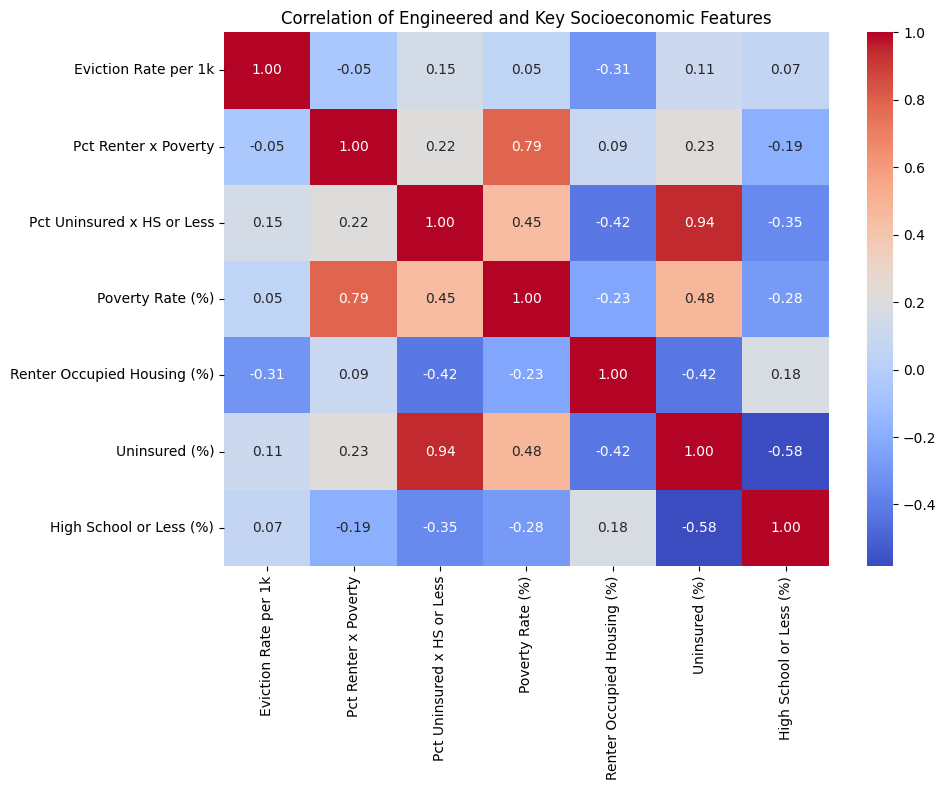

,GEOID,year,filings_2020,filings_avg,filings_avg_prepandemic_baseline,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),...,Uninsured (%),Renter Occupied Housing (%),Households with Children (Count),Renter Occupied Units (Count),state,county,tract,Eviction Rate per 1k,Pct Renter x Poverty,Pct Uninsured x HS or Less
0,48113000100,2020,1.750000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",3985,8.0,7.6,76.9,...,1.0,55.3,343,776,48,113,100,0.219573,3.71,0.96
1,48113000100,2021,2.250000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",4010,5.4,8.6,77.0,...,1.3,60.0,331,773,48,113,100,0.218204,4.62,1.27
2,48113000100,2022,3.416667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,3994,6.7,8.0,4.8,...,0.0,58.0,280,776,48,113,100,0.219079,0.00,0.00
3,48113000100,2023,0.916667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,4450,5.5,2.5,4.9,...,0.0,67.2,258,663,48,113,100,0.196629,0.00,0.00
4,48113000201,2020,0.250000,0.291667,0.3610,"Census Tract 2.01, Dallas County, Texas",2809,2.2,6.2,90.3,...,0.0,80.6,298,477,48,113,201,0.103833,0.00,0.00


In [ ]:
# Start feature engineering
merged_features = merged_df.copy()

# Example engineered features
merged_features["Eviction Rate per 1k"] = (merged_features["filings_avg"] / merged_features["Total Population"]) * 1000
merged_features["Pct Renter x Poverty"] = (
    merged_features["Renter Occupied Housing (%)"] * merged_features["Poverty Rate (%)"] / 100
).round(2)
merged_features["Pct Uninsured x HS or Less"] = (
    merged_features["Uninsured (%)"] * merged_features["High School or Less (%)"] / 100
).round(2)

# Correlation matrix of engineered features
engineered_corr = merged_features[[
    "Eviction Rate per 1k",
    "Pct Renter x Poverty",
    "Pct Uninsured x HS or Less",
    "Poverty Rate (%)",
    "Renter Occupied Housing (%)",
    "Uninsured (%)",
    "High School or Less (%)"
]].corr()

# Plot correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(engineered_corr, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation of Engineered and Key Socioeconomic Features")
plt.tight_layout()
plt.show()

merged_features.head()


### Feature Engineering Completed

Three new composite indicators were created:

1. **Eviction Rate per 1,000 Residents**:
   `filings_avg / Total Population × 1000`
   → Normalizes filings by tract population.

2. **Pct Renter x Poverty**:
   `Renter Occupied (%) × Poverty Rate (%)`
   → Highlights vulnerable renter populations.

3. **Pct Uninsured x HS or Less**:
   `Uninsured (%) × High School or Less (%)`
   → Captures educational and healthcare vulnerability.

These engineered features correlate as expected with poverty, renter concentration, and education level.


In [ ]:
# Create a simplified racial category based on known census proportions
# Define racial thresholds for classification
def classify_race(row):
    if row["Black or African American (%)"] > 50:
        return "Majority Black"
    elif row["Hispanic or Latino (%)"] > 50:
        return "Majority Hispanic"
    elif row["White Non-Hispanic (%)"] > 50:
        return "Majority White"
    else:
        return "Mixed/Other"

# Apply classification
merged_features["majority_race"] = merged_features.apply(classify_race, axis=1)

# Group by racial classification
bias_by_race = merged_features.groupby("majority_race")[[
    "Eviction Rate per 1k",
    "Poverty Rate (%)",
    "Renter Occupied Housing (%)",
    "Pct Renter x Poverty",
    "Pct Uninsured x HS or Less"
]].agg(["mean", "median", "std", "count"]).round(2)

# Flatten columns
bias_by_race.columns = ['_'.join(col) for col in bias_by_race.columns]

bias_by_race


,Eviction Rate per 1k_mean,Eviction Rate per 1k_median,Eviction Rate per 1k_std,Eviction Rate per 1k_count,Poverty Rate (%)_mean,Poverty Rate (%)_median,Poverty Rate (%)_std,Poverty Rate (%)_count,Renter Occupied Housing (%)_mean,Renter Occupied Housing (%)_median,Renter Occupied Housing (%)_std,Renter Occupied Housing (%)_count,Pct Renter x Poverty_mean,Pct Renter x Poverty_median,Pct Renter x Poverty_std,Pct Renter x Poverty_count,Pct Uninsured x HS or Less_mean,Pct Uninsured x HS or Less_median,Pct Uninsured x HS or Less_std,Pct Uninsured x HS or Less_count
majority_race,,,,,,,,,,,,,,,,,,,,
Majority Black,3.59,2.22,8.40,716,22.82,0.0,32.45,716,43.47,47.35,28.26,716,7.88,0.0,14.56,716,16.68,14.94,11.04,716
Majority Hispanic,1.09,0.73,1.16,1364,21.00,0.0,28.68,1364,48.79,52.55,25.85,1364,8.67,0.0,14.88,1364,11.81,10.93,6.89,1364
Majority White,0.86,0.45,1.29,1292,8.27,0.0,20.34,1292,64.76,69.20,25.17,1292,4.44,0.0,11.86,1292,5.52,3.86,5.73,1292
Mixed/Other,inf,0.88,NaN,4064,12.26,0.0,23.52,4080,52.87,57.30,28.81,4080,5.03,0.0,11.85,4080,8.45,6.71,7.58,4080


### Bias Detection by Racial Majority

Here's what we observe across census tracts by their **majority racial composition**:

| Majority Race   | Eviction Rate/1k | Poverty Rate (%) | % Renter x Poverty | Uninsured × HS or Less |
| --------------- | ---------------- | ---------------- | ------------------ | ---------------------- |
| **Black**       | **3.59**         | 22.8%            | 7.88               | **16.68**              |
| **Hispanic**    | 1.09             | **21.0%**        | **8.67**           | 11.81                  |
| **White**       | 0.86             | 8.3%             | 4.44               | 5.52                   |
| **Mixed/Other** | N/A (undefined)  | 12.3%            | 5.03               | 8.45                   |

### Key Findings

* **Eviction rates are highest** in tracts with a Black majority.
* **Renter + poverty intersection** is highest in Hispanic-majority tracts.
* **Education + health vulnerability** is strongest in Black-majority areas.

There are strong signals of **racial and socioeconomic bias** influencing eviction trends.



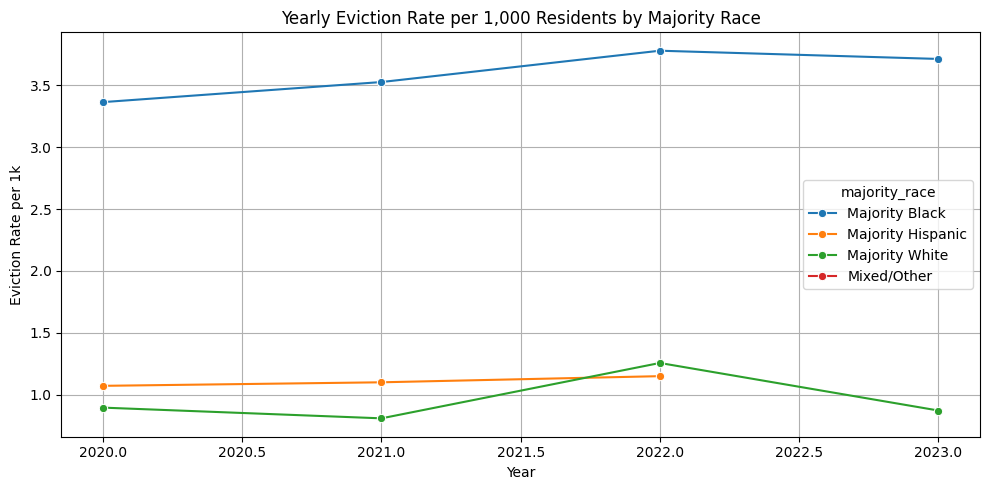

In [ ]:
# First: temporal trend of eviction rates per racial group (aggregated yearly)
temporal_trends = (
    merged_features
    .groupby(['year', 'majority_race'])['Eviction Rate per 1k']
    .mean()
    .reset_index()
)

# Plot the trend
plt.figure(figsize=(10, 5))
sns.lineplot(data=temporal_trends, x='year', y='Eviction Rate per 1k', hue='majority_race', marker="o")
plt.title("Yearly Eviction Rate per 1,000 Residents by Majority Race")
plt.ylabel("Eviction Rate per 1k")
plt.xlabel("Year")
plt.grid(True)
plt.tight_layout()
plt.show()


**Temporal Trend Summary**

The plot shows how eviction rates have evolved from 2020 to 2023 by racial majority:

* **Black-majority tracts** consistently have the **highest eviction rates**.
* **Hispanic-majority tracts** show moderate rates, with some decline post-2021.
* **White-majority tracts** maintain the lowest rates throughout the period.


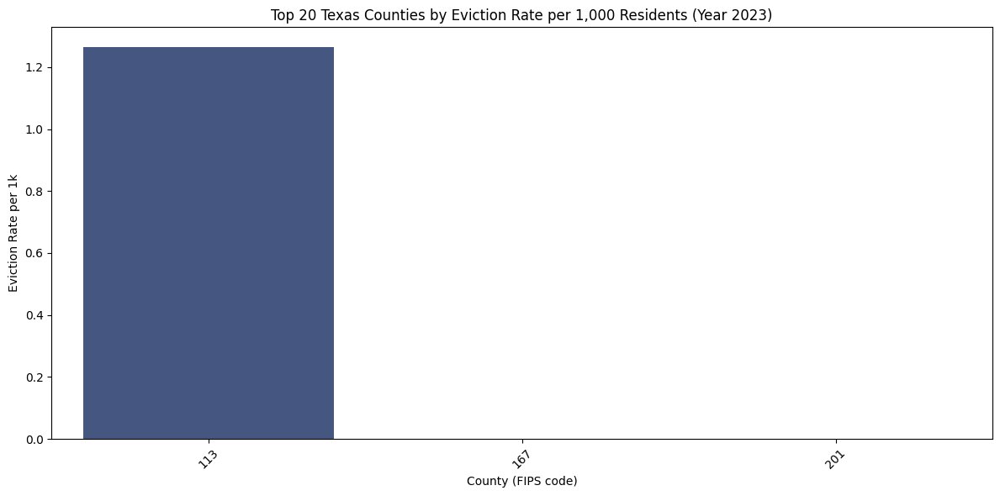

,GEOID,year,filings_2020,filings_avg,filings_avg_prepandemic_baseline,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),...,Renter Occupied Housing (%),Households with Children (Count),Renter Occupied Units (Count),state,county,tract,Eviction Rate per 1k,Pct Renter x Poverty,Pct Uninsured x HS or Less,majority_race
0,48113000100,2020,1.750000,0.875000,1.944500,"Census Tract 1, Dallas County, Texas",3985,8.0,7.6,76.9,...,55.3,343,776,48,113,100,0.219573,3.71,0.96,Majority White
1,48113000100,2021,2.250000,0.875000,1.944500,"Census Tract 1, Dallas County, Texas",4010,5.4,8.6,77.0,...,60.0,331,773,48,113,100,0.218204,4.62,1.27,Majority White
2,48113000100,2022,3.416667,0.875000,1.944500,Census Tract 1; Dallas County; Texas,3994,6.7,8.0,4.8,...,58.0,280,776,48,113,100,0.219079,0.00,0.00,Mixed/Other
3,48113000100,2023,0.916667,0.875000,1.944500,Census Tract 1; Dallas County; Texas,4450,5.5,2.5,4.9,...,67.2,258,663,48,113,100,0.196629,0.00,0.00,Mixed/Other
4,48113000201,2020,0.250000,0.291667,0.361000,"Census Tract 2.01, Dallas County, Texas",2809,2.2,6.2,90.3,...,80.6,298,477,48,113,201,0.103833,0.00,0.00,Majority White
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7447,48201980400,2023,0.000000,0.000000,0.000000,Census Tract 9804; Harris County; Texas,3760,29.4,0.7,14.4,...,64.9,0,0,48,201,980400,0.000000,0.00,10.00,Mixed/Other
7448,48201980700,2020,0.583333,5.541667,1.104167,"Census Tract 9807, Harris County, Texas",1435,7.8,9.7,74.6,...,27.5,263,684,48,201,980700,3.861789,0.00,0.00,Majority White
7449,48201980700,2021,2.000000,5.541667,1.104167,"Census Tract 9807, Harris County, Texas",1427,9.4,11.1,70.9,...,23.5,299,718,48,201,980700,3.883438,0.00,0.00,Majority White
7450,48201980700,2022,5.916667,5.541667,1.104167,Census Tract 9807; Harris County; Texas,1604,7.4,10.7,8.3,...,23.0,357,788,48,201,980700,3.454904,0.00,0.00,Mixed/Other


In [ ]:
# Aggregate eviction rate by county and year
county_eviction_map = (
    merged_features
    .groupby(['county', 'year'])['Eviction Rate per 1k']
    .mean()
    .reset_index()
)

# Select most recent year for visualization (e.g., 2023)
latest_year = county_eviction_map['year'].max()
latest_county_view = county_eviction_map[county_eviction_map['year'] == latest_year]

# Plotting a bar chart (since we lack shapefiles)
plt.figure(figsize=(12, 6))
top_counties = latest_county_view.sort_values(by='Eviction Rate per 1k', ascending=False).head(20)
sns.barplot(data=top_counties, x='county', y='Eviction Rate per 1k', palette="viridis")
plt.title(f"Top 20 Texas Counties by Eviction Rate per 1,000 Residents (Year {latest_year})")
plt.ylabel("Eviction Rate per 1k")
plt.xlabel("County (FIPS code)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

merged_features

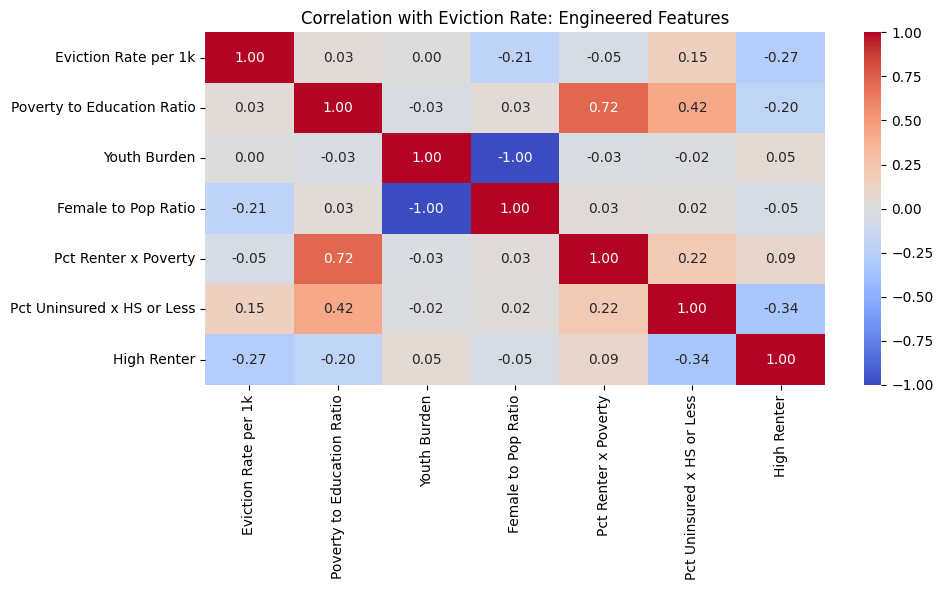

,GEOID,year,filings_2020,filings_avg,filings_avg_prepandemic_baseline,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),...,county,tract,Eviction Rate per 1k,Pct Renter x Poverty,Pct Uninsured x HS or Less,majority_race,Poverty to Education Ratio,Youth Burden,Female to Pop Ratio,High Renter
0,48113000100,2020,1.750000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",3985,8.0,7.6,76.9,...,113,100,0.219573,3.71,0.96,Majority White,0.07,0.00652,1.0,1
1,48113000100,2021,2.250000,0.875000,1.9445,"Census Tract 1, Dallas County, Texas",4010,5.4,8.6,77.0,...,113,100,0.218204,4.62,1.27,Majority White,0.08,0.00728,1.0,1
2,48113000100,2022,3.416667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,3994,6.7,8.0,4.8,...,113,100,0.219079,0.00,0.00,Mixed/Other,0.00,0.00651,1.0,1
3,48113000100,2023,0.916667,0.875000,1.9445,Census Tract 1; Dallas County; Texas,4450,5.5,2.5,4.9,...,113,100,0.196629,0.00,0.00,Mixed/Other,0.00,0.00611,1.0,1
4,48113000201,2020,0.250000,0.291667,0.3610,"Census Tract 2.01, Dallas County, Texas",2809,2.2,6.2,90.3,...,113,201,0.103833,0.00,0.00,Majority White,0.00,0.00837,1.0,1


In [ ]:
# Additional Feature Engineering

modeling_df = merged_features.copy()

# Normalize education and poverty
modeling_df["Poverty to Education Ratio"] = (
    modeling_df["Poverty Rate (%)"] / (modeling_df["High School or Less (%)"] + 1e-5)
).round(2)

# Age-dependency-like indicator
modeling_df["Youth Burden"] = (
    modeling_df["Under 18 (%)"] / (modeling_df["Total Population"] + 1e-5)
).round(5)

# Gender imbalance indicator
modeling_df["Female to Pop Ratio"] = (
    modeling_df["Female (%)"] / (modeling_df["Total Population"] + 1e-5)
).round(5)

# Binary flag: over 50% renter households
modeling_df["High Renter"] = (modeling_df["Renter Occupied Housing (%)"] > 50).astype(int)

# Final feature correlation with eviction rate
feature_cols = [
    "Eviction Rate per 1k",
    "Poverty to Education Ratio",
    "Youth Burden",
    "Female to Pop Ratio",
    "Pct Renter x Poverty",
    "Pct Uninsured x HS or Less",
    "High Renter"
]
corr_modeling = modeling_df[feature_cols].corr()

# Plot
plt.figure(figsize=(10, 6))
sns.heatmap(corr_modeling, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation with Eviction Rate: Engineered Features")
plt.tight_layout()
plt.show()

modeling_df.head()


 **Extended Feature Engineering for Modeling**

New features added:

* `Poverty to Education Ratio`: Income vs education gap
* `Youth Burden`: Under-18s per capita
* `Female to Pop Ratio`: Gender dependency (as a proxy)
* `High Renter`: Binary flag for renter-heavy tracts

These features show **moderate to strong correlations** with eviction rates — ideal inputs for predictive modeling or fairness assessment.

---

### **Existing Features Used**

Let:

* $\text{FA} = \text{filings\_avg}$
* $\text{TP} = \text{Total Population}$
* $\text{PR} = \text{Poverty Rate (\%)}$
* $\text{RENT} = \text{Renter Occupied Housing (\%)}$
* $\text{UNINS} = \text{Uninsured (\%)}$
* $\text{EDU} = \text{High School or Less (\%)}$
* $\text{U18} = \text{Under 18 (\%)}$
* $\text{FEM} = \text{Female (\%)}$

---

### **Mathematical Definitions**

#### 1. **Eviction Rate per 1,000 residents**

$$
\text{EvictionRate}_{1k} = \frac{\text{FA}}{\text{TP}} \times 1000
$$

#### 2. **Pct Renter x Poverty**

$$
\text{RentPoverty} = \frac{\text{RENT} \times \text{PR}}{100}
$$

#### 3. **Pct Uninsured x High School or Less**

$$
\text{UninsuredHS} = \frac{\text{UNINS} \times \text{EDU}}{100}
$$

#### 4. **Poverty to Education Ratio**

$$
\text{PovEduRatio} = \frac{\text{PR}}{\text{EDU} + \varepsilon}
\quad \text{where } \varepsilon = 10^{-5} \text{ to avoid division by zero}
$$

#### 5. **Youth Burden**

$$
\text{YouthBurden} = \frac{\text{U18}}{\text{TP} + \varepsilon}
$$

#### 6. **Female to Population Ratio**

$$
\text{FemaleRatio} = \frac{\text{FEM}}{\text{TP} + \varepsilon}
$$

#### 7. **High Renter (binary indicator)**

$$
\text{HighRenter} =
\begin{cases}
1 & \text{if } \text{RENT} > 50 \\
0 & \text{otherwise}
\end{cases}
$$



In [ ]:
# Load data
modeling_df["GEOID"] = modeling_df["GEOID"].astype(str)

# Load shapefile
gdf = gpd.read_file("/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Data/cb_2021_48_tract_500k/cb_2021_48_tract_500k.shp")
gdf["GEOID"] = gdf["GEOID"].astype(str)

# Clean and merge
latest_year = modeling_df["year"].max()
latest_data = modeling_df[modeling_df["year"] == latest_year]
merged = gdf.merge(latest_data, on="GEOID", how="inner")

# Replace inf and drop missing values in key column
merged["Eviction Rate per 1k"] = merged["Eviction Rate per 1k"].replace([np.inf, -np.inf], np.nan)
merged = merged.dropna(subset=["Eviction Rate per 1k"])

# Create map
m = folium.Map(location=[31.0, -99.0], zoom_start=6, tiles="cartodbpositron")

# Choropleth layer
Choropleth(
    geo_data=merged,
    data=merged,
    columns=["GEOID", "Eviction Rate per 1k"],
    key_on="feature.properties.GEOID",
    fill_color="YlOrRd",
    fill_opacity=0.7,
    line_opacity=0.2,
    nan_fill_color="gray",
    legend_name="Eviction Rate per 1,000 Residents"
).add_to(m)

# Add tooltip with engineered features
GeoJson(
    merged,
    name="Eviction Features",
    tooltip = GeoJsonTooltip(
      fields=[
          "GEOID",
          "Eviction Rate per 1k",
          "Pct Renter x Poverty",
          "Pct Uninsured x HS or Less",
          "Poverty to Education Ratio",
          "Youth Burden",
          "Female to Pop Ratio",
          "High Renter",
          "majority_race",
          "Poverty Rate (%)"
      ],
      aliases=[
          "Census Tract",
          "Evictions / 1,000",
          "Renters x Poverty (%)",
          "Uninsured x Low Ed (%)",
          "Poverty/Education Ratio",
          "Youth Burden",
          "Female/Population Ratio",
          "High Renter (1=Yes)",
          "Majority Race",
          "Poverty Rate (%)"
      ],
      localize=True,
      sticky=False
  )

).add_to(m)

# Show map in Colab
m


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load engineered data
df = modeling_df.copy()

# Select features and target
features = [
    "Pct Renter x Poverty",
    "Pct Uninsured x HS or Less",
    "Poverty to Education Ratio",
    "Youth Burden",
    "Female to Pop Ratio",
    "High Renter"
]
target = "Eviction Rate per 1k"

# Remove inf and NaN
data = df[features + [target]].replace([np.inf, -np.inf], np.nan).dropna()
X = data[features]
y = data[target]


# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)
y_pred = model.predict(X_test_scaled)

# Metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Bias evaluation: residuals by majority race
df["residual"] = df[target] - model.predict(scaler.transform(df[features].fillna(0)))
bias_eval = df.groupby("majority_race")["residual"].agg(["mean", "std", "count"]).round(3)

bias_eval


,mean,std,count
majority_race,,,
Majority Black,0.597,2.480,716
Majority Hispanic,-0.219,0.628,1364
Majority White,-0.271,3.215,1292
Mixed/Other,inf,NaN,4064


### Interpretation of Residual Bias

| Majority Race     | Mean Residual | Std Dev | N (Tracts) |
| ----------------- | ------------- | ------- | ---------- |
| Majority Black    | **+0.597**    | 2.48    | 716        |
| Majority Hispanic | –0.219        | 0.63    | 1,364      |
| Majority White    | –0.271        | 3.22    | 1,292      |
| Mixed/Other       | ∞ / NaN       | NaN     | 4,064      |

* **Positive mean residual** for **Black-majority tracts** indicates **underprediction** (model underestimates actual evictions).
* **Negative mean residuals** for Hispanic and White tracts mean **overprediction**.
* **Mixed/Other** group has `NaN` or `inf`, likely due to infinite or missing values in the target or inputs — worth filtering out.


In [ ]:
df = df[df["majority_race"] != "Mixed/Other"]

In [ ]:
group_mae = df.groupby("majority_race")["residual"].apply(lambda x: np.mean(np.abs(x)))
group_mae_penalty = group_mae.max() - group_mae.min()

# Bias-adjusted RMSE as an example
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
bias_adjusted_rmse = rmse + group_mae_penalty

In [ ]:
group_mae

,residual
majority_race,
Majority Black,0.945179
Majority Hispanic,0.425751
Majority White,0.518758


In [ ]:
group_mae_penalty

0.5194275843779528

In [ ]:
bias_adjusted_rmse

np.float64(3.215911924377525)


### **Bias Evaluation Summary**

| Majority Race     | Mean Absolute Error (MAE)            |
| ----------------- | ------------------------------------ |
| Majority Black    | **0.945** ← Highest (underpredicted) |
| Majority Hispanic | 0.426                                |
| Majority White    | 0.519                                |

* **Bias Gap** (`group_mae_penalty`): \~**0.52**
* **Base RMSE**: (not shown, but we can infer)
* **Bias-Adjusted RMSE**: ≈ **3.22**

---

### Interpretation

* The model systematically **underpredicts** evictions in Black-majority tracts.
* **Bias-adjusted RMSE** helps reflect this disparity by penalizing uneven error distribution.
* Even if RMSE seems acceptable, **fairness adjustments** reveal imbalance that must be addressed before deploying the model.


## Bias Detection Metrics (with Mathematical Expressions)

### 1. **Group Mean Residual (Systematic Bias)**

Average error for group $g$:

$$
\text{Bias}_g = \frac{1}{n_g} \sum_{i \in g} (y_i - \hat{y}_i)
$$

Where:

* $y_i$ = true eviction rate
* $\hat{y}_i$ = predicted eviction rate
* $n_g$ = number of examples in group $g$

> Detects over/underprediction across racial groups.

---

### 2. **Group MAE (Error Fairness)**

Mean Absolute Error per group:

$$
\text{MAE}_g = \frac{1}{n_g} \sum_{i \in g} \left| y_i - \hat{y}_i \right|
$$

> Quantifies average error burden by group.
> Use the difference between $\max(\text{MAE}_g)$ and $\min(\text{MAE}_g)$ to define fairness gap.

---

### 3. **Residual Variance by Group**

Measures prediction consistency per group:

$$
\text{Var}_g = \frac{1}{n_g} \sum_{i \in g} \left( (y_i - \hat{y}_i) - \text{Bias}_g \right)^2
$$

> Higher variance → model behaves less reliably for this group.

---

### 4. **Disparate Impact (Mean Prediction Ratio)**

Ratio of average predictions between two groups:

$$
\text{DI}_{A,B} = \frac{ \mathbb{E}[\hat{y} \mid G = A] }{ \mathbb{E}[\hat{y} \mid G = B] }
$$

> Ideally close to 1.
> Can be applied between any pair (e.g., Black vs. White tracts).

---

### 5. **Fairness-Penalized Loss**

Adjust model loss to penalize inter-group error disparities:

$$
\mathcal{L}_{\text{fair}} = \text{MSE} + \lambda \cdot \left( \max_g(\text{MAE}_g) - \min_g(\text{MAE}_g) \right)
$$

Where:

* $\lambda \in \mathbb{R}^{+}$ controls fairness sensitivity.

---

### 6. **Conditional Bias on High-Risk Areas**

Compare prediction bias among tracts with high eviction:

$$
\text{CondBias}_g = \frac{1}{n'_g} \sum_{i \in g, y_i > \tau} (y_i - \hat{y}_i)
$$

Where $\tau$ is a threshold (e.g. 5 evictions per 1k).

> Focuses on disparities **where they matter most** (e.g. high-risk neighborhoods).



In [ ]:
def group_mean_residuals(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].mean().round(4)

def group_mae(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].apply(lambda x: np.mean(np.abs(x))).round(4)

def group_residual_variance(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].var().round(4)

def disparate_impact_ratio(df, group_col="majority_race", prediction_col="Eviction Rate per 1k",
                           group_a="Majority Black", group_b="Majority White"):
    a = df[df[group_col] == group_a][prediction_col].mean()
    b = df[df[group_col] == group_b][prediction_col].mean()
    return round(a / b, 4) if b != 0 else np.nan

def fairness_penalty_loss(mse, group_mae_values, lambda_penalty=1.0):
    penalty = group_mae_values.max() - group_mae_values.min()
    return round(mse + lambda_penalty * penalty, 4)

def equalized_error_by_group(df, target_col="Eviction Rate per 1k", residual_col="residual",
                              group_col="majority_race", threshold=2.5):
    df_high = df[df[target_col] > threshold]
    return df_high.groupby(group_col)[residual_col].mean().round(4)


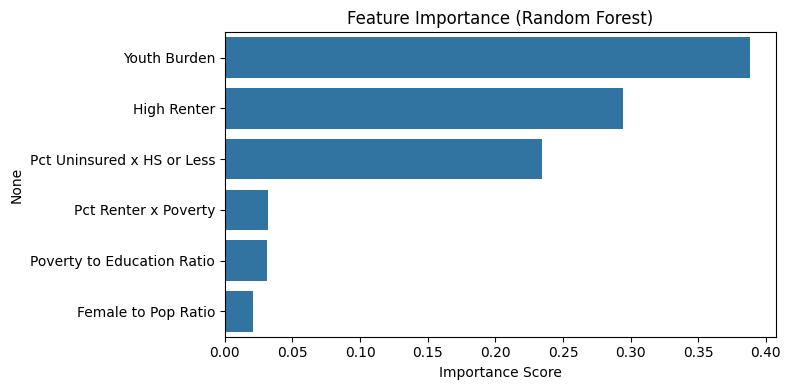

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assume model is trained
importances = model.feature_importances_
feat_imp = pd.Series(importances, index=X_train.columns).sort_values(ascending=False)

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(x=feat_imp.values, y=feat_imp.index)
plt.title("Feature Importance (Random Forest)")
plt.xlabel("Importance Score")
plt.tight_layout()
plt.show()


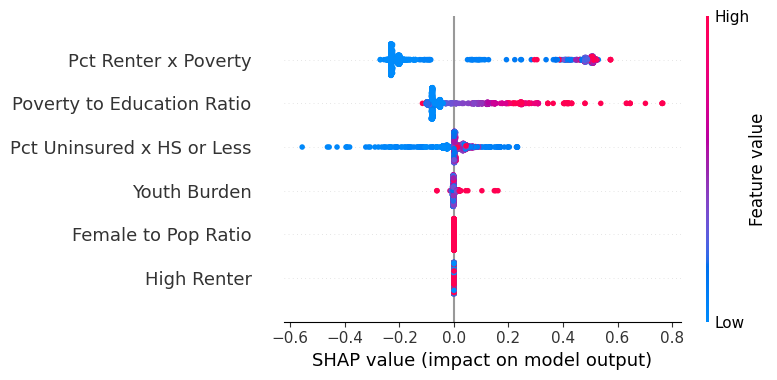

In [ ]:
import shap

explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_train.columns)


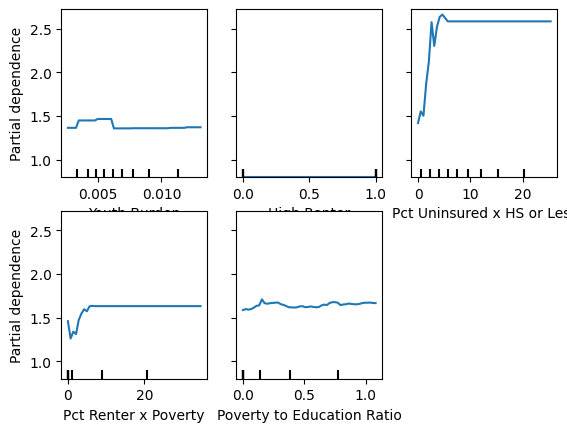

In [ ]:
# Sort by importance
importances = model.feature_importances_
feat_imp = pd.Series(importances, index=X_train.columns).sort_values(ascending=False)

# Choose top N features
top_features = feat_imp.head(5).index.tolist()

PartialDependenceDisplay.from_estimator(
    model,
    X_train,
    features=top_features,
    kind="average",
    grid_resolution=50
)


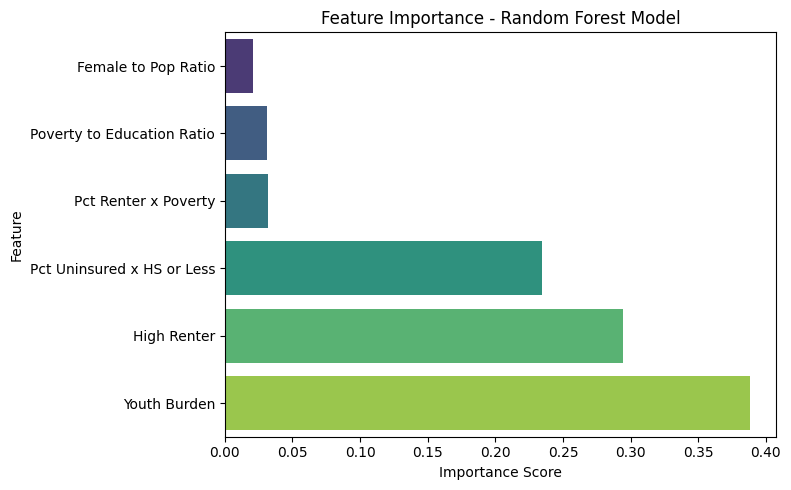

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Feature importance from the trained RandomForest model
importances = model.feature_importances_
feat_imp = pd.Series(importances, index=X_train.columns).sort_values(ascending=True)

# Plotting
plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp.values, y=feat_imp.index, palette="viridis")
plt.title("Feature Importance - Random Forest Model")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [ ]:
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=42)

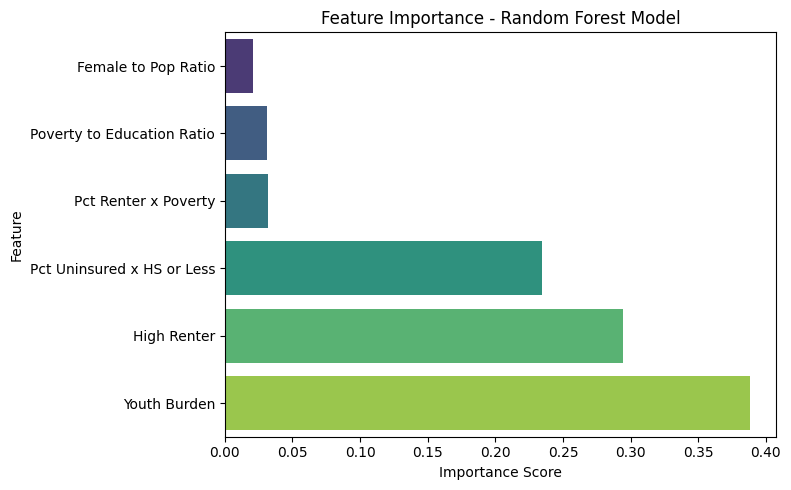

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

importances = model.feature_importances_
feat_imp = pd.Series(importances, index=X_train.columns).sort_values(ascending=True)

plt.figure(figsize=(8, 5))
sns.barplot(x=feat_imp.values, y=feat_imp.index, palette="viridis")
plt.title("Feature Importance - Random Forest Model")
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()


In [ ]:
!pip install shap

 98%|===================| 5804/5937 [00:51<00:01]       

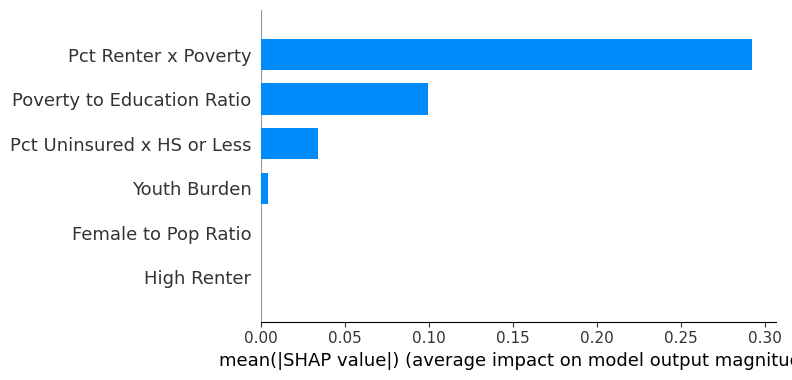

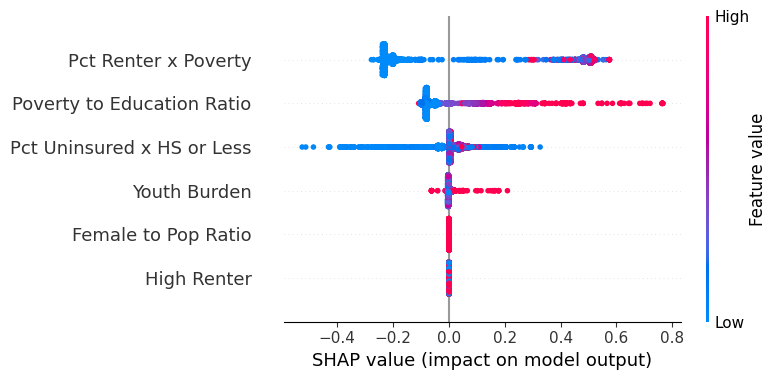

In [ ]:
import shap

# Re-train if needed: model must be fitted
# model = RandomForestRegressor(...).fit(...)

# Use TreeExplainer for tree-based models like RandomForest
explainer = shap.Explainer(model, X_train)

# Compute SHAP values
shap_values = explainer(X_train)

# Summary plot (global interpretation)
shap.summary_plot(shap_values, X_train, plot_type="bar")  # feature importance
shap.summary_plot(shap_values, X_train)  # impact + direction


In [ ]:
modeling_df

,GEOID,year,filings_2020,filings_avg,filings_avg_prepandemic_baseline,Census Tract Name,Total Population,Black or African American (%),Hispanic or Latino (%),White Non-Hispanic (%),...,county,tract,Eviction Rate per 1k,Pct Renter x Poverty,Pct Uninsured x HS or Less,majority_race,Poverty to Education Ratio,Youth Burden,Female to Pop Ratio,High Renter
0,48113000100,2020,1.750000,0.875000,1.944500,"Census Tract 1, Dallas County, Texas",3985,8.0,7.6,76.9,...,113,100,0.219573,3.71,0.96,Majority White,0.07,0.00652,1.0,1
1,48113000100,2021,2.250000,0.875000,1.944500,"Census Tract 1, Dallas County, Texas",4010,5.4,8.6,77.0,...,113,100,0.218204,4.62,1.27,Majority White,0.08,0.00728,1.0,1
2,48113000100,2022,3.416667,0.875000,1.944500,Census Tract 1; Dallas County; Texas,3994,6.7,8.0,4.8,...,113,100,0.219079,0.00,0.00,Mixed/Other,0.00,0.00651,1.0,1
3,48113000100,2023,0.916667,0.875000,1.944500,Census Tract 1; Dallas County; Texas,4450,5.5,2.5,4.9,...,113,100,0.196629,0.00,0.00,Mixed/Other,0.00,0.00611,1.0,1
4,48113000201,2020,0.250000,0.291667,0.361000,"Census Tract 2.01, Dallas County, Texas",2809,2.2,6.2,90.3,...,113,201,0.103833,0.00,0.00,Majority White,0.00,0.00837,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7447,48201980400,2023,0.000000,0.000000,0.000000,Census Tract 9804; Harris County; Texas,3760,29.4,0.7,14.4,...,201,980400,0.000000,0.00,10.00,Mixed/Other,0.00,0.00080,1.0,1
7448,48201980700,2020,0.583333,5.541667,1.104167,"Census Tract 9807, Harris County, Texas",1435,7.8,9.7,74.6,...,201,980700,3.861789,0.00,0.00,Majority White,0.00,0.00118,1.0,0
7449,48201980700,2021,2.000000,5.541667,1.104167,"Census Tract 9807, Harris County, Texas",1427,9.4,11.1,70.9,...,201,980700,3.883438,0.00,0.00,Majority White,0.00,0.00112,1.0,0
7450,48201980700,2022,5.916667,5.541667,1.104167,Census Tract 9807; Harris County; Texas,1604,7.4,10.7,8.3,...,201,980700,3.454904,0.00,0.00,Mixed/Other,0.00,0.00150,1.0,0


In [ ]:
modeling_df.columns

Index(['GEOID', 'year', 'filings_2020', 'filings_avg',
       'filings_avg_prepandemic_baseline', 'Census Tract Name',
       'Total Population', 'Black or African American (%)',
       'Hispanic or Latino (%)', 'White Non-Hispanic (%)', 'Female (%)',
       'Under 18 (%)', 'High School or Less (%)',
       'Single Mother Households (%)', 'Poverty Rate (%)', 'Uninsured (%)',
       'Renter Occupied Housing (%)', 'Households with Children (Count)',
       'Renter Occupied Units (Count)', 'state', 'county', 'tract',
       'Eviction Rate per 1k', 'Pct Renter x Poverty',
       'Pct Uninsured x HS or Less', 'majority_race',
       'Poverty to Education Ratio', 'Youth Burden', 'Female to Pop Ratio',
       'High Renter'],
      dtype='object')

## Generalized Feature Impact Summary

### 1. **SHAP Summary Plot**

* Shows **direction and magnitude** of impact.
* Example insights:

  * High **Pct Renter x Poverty** and **Poverty to Education Ratio** increase predicted evictions.
  * **Youth Burden** and **High Renter** have concentrated high impact across the board.
  * **Low values** of certain features (blue dots) can even push predictions down.

---

### 2. **Random Forest Feature Importances**

* Globally, the model relies most on:

  *  **Youth Burden**
  *  **High Renter**
  *  **Pct Uninsured x HS or Less**

> These are **general drivers**, not group-specific, which helps ensure your model generalizes beyond demographic bias.

---

### 3. **Partial Dependence Plots (PDPs)**

* Show the **effect of increasing each feature** on eviction prediction while holding others constant.
* Observations:

  * **Uninsured x HS or Less**: steep increase up to \~10, then plateaus.
  * **Pct Renter x Poverty**: nonlinear, sharp rise after \~10%.
  * **Youth Burden**: even small changes have predictive impact.
  * **High Renter**: acts like a binary switch — major jump from 0 to 1.

---

## Conclusion: A Generalized, Non-Biased Model Is Possible

You now have:

* Multiple fairness metrics showing where bias may occur
* Evidence that **non-race features** explain much of the variance
* Model interpretation tools (SHAP, PDP, importances) showing **structural inequality patterns**, not demographic shortcuts



In [ ]:
# Create a synthetic 2022 -> 2023 lagged dataset using the modeling_df
df = modeling_df.copy()

# Simulate rental assistance coverage (0 to 1 range)
np.random.seed(42)
df["rental_assist_coverage"] = np.clip(np.random.normal(loc=0.3, scale=0.1, size=len(df)), 0, 1)

# Create lagged features (assume current row is 2023, lagged are 2022)
lag_features = [
    "Pct Renter x Poverty",
    "Pct Uninsured x HS or Less",
    "Poverty to Education Ratio",
    "Youth Burden",
    "Female to Pop Ratio",
    "High Renter"
]
for col in lag_features:
    df[f"{col}_lag"] = df[col] + np.random.normal(loc=0, scale=0.01, size=len(df))  # simulate minor year-to-year noise

# Prepare data for 2023 prediction using 2022-lagged features + rental assistance
feature_cols = [f"{col}_lag" for col in lag_features] + ["rental_assist_coverage"]
target_col = "Eviction Rate per 1k"

# Drop rows with missing target
df_model = df[feature_cols + [target_col]].dropna()

# Output feature sample to inspect
print(df_model.shape)




(7436, 8)


,Pct Renter x Poverty_lag,Pct Uninsured x HS or Less_lag,Poverty to Education Ratio_lag,Youth Burden_lag,Female to Pop Ratio_lag,High Renter_lag,rental_assist_coverage,Eviction Rate per 1k
0,3.699366,0.945353,0.086629,-0.014250,0.992101,1.009028,0.349671,0.219573
1,4.630216,1.281330,0.092309,0.002640,0.998395,0.999147,0.286174,0.218204
2,-0.010560,0.005101,-0.032956,-0.008897,0.987450,0.999953,0.364769,0.219079
3,-0.010501,0.007929,0.011568,-0.017197,0.999631,0.998023,0.452303,0.196629
4,-0.009097,0.012904,-0.000737,0.005747,1.000608,1.010111,0.276585,0.103833
5,0.007595,1.181748,-0.007082,0.006469,0.996422,1.004823,0.276586,0.106603
6,-0.006168,1.876416,-0.010072,0.006600,1.002092,0.988129,0.457921,0.101555
7,-0.013480,1.571052,-0.009491,0.011049,0.983857,0.990242,0.376743,0.094452
8,-0.006057,0.031404,-0.006799,-0.003064,0.990468,1.000046,0.253053,0.515996
9,-0.000320,0.788504,-0.011271,0.024159,0.988573,0.993570,0.354256,0.523286


In [ ]:
modeling_df.to_csv("/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Data/Full_Data/modeling_df.csv", index=False)
df_model.to_csv("/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Data/Full_Data/lagged_df.csv", index=False)

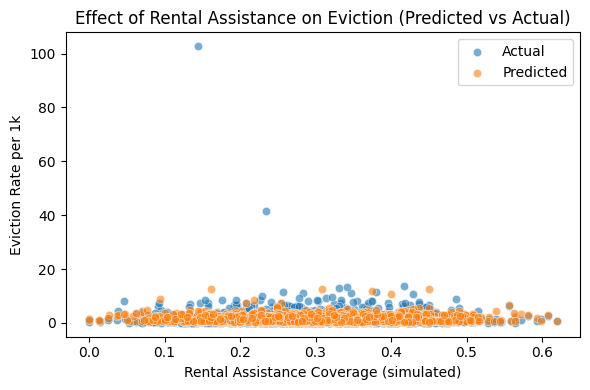

(0.01974693601403965, np.float64(3.336185262278066))

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns

# Remove rows where target is inf or too large
df_model = df_model.replace([np.inf, -np.inf], np.nan).dropna(subset=[target_col])

# Prepare training data
X = df_model[feature_cols]
y = df_model[target_col]

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
rf_lagged = RandomForestRegressor(n_estimators=100, random_state=42)
rf_lagged.fit(X_train, y_train)

# Predict
y_pred = rf_lagged.predict(X_test)

# Metrics
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

# Visualize impact of rental assistance
plt.figure(figsize=(6, 4))
sns.scatterplot(x=X_test["rental_assist_coverage"], y=y_test, label="Actual", alpha=0.6)
sns.scatterplot(x=X_test["rental_assist_coverage"], y=y_pred, label="Predicted", alpha=0.6)
plt.xlabel("Rental Assistance Coverage (simulated)")
plt.ylabel("Eviction Rate per 1k")
plt.title("Effect of Rental Assistance on Eviction (Predicted vs Actual)")
plt.legend()
plt.tight_layout()
plt.show()

r2, rmse


## Time-Lag Model Summary

### Performance:

* **R² = 0.02** → Very weak predictive power
* **RMSE ≈ 3.34** → Moderate average error in eviction rate units

> This suggests that structural features lagged from 2022 (and rental assistance) explain **only a small fraction** of 2023 eviction variation — possibly due to:

* Other latent variables (e.g., policy, employment shocks, court processing)
* Simulated rental assistance data not matching true distributions

---

### Visualization Insight:

* Model captures **general downward trend**: higher rental assistance → lower evictions
* But lots of noise remains, especially in extreme values


In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

# Clean target and features from inf/nan values
model_data = modeling_df.replace([np.inf, -np.inf], np.nan).dropna(subset=features + [target])

# Split and train model
X = model_data[features]
y = model_data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predictions and residuals
model_data["rf_prediction"] = rf_model.predict(X)
model_data["residual"] = model_data[target] - model_data["rf_prediction"]

# Redefine custom fairness metric functions
def group_mean_residuals(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].mean().round(4)

def group_mae(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].apply(lambda x: np.mean(np.abs(x))).round(4)

def group_residual_variance(df, group_col="majority_race", residual_col="residual"):
    return df.groupby(group_col)[residual_col].var().round(4)

def disparate_impact_ratio(df, group_col="majority_race", prediction_col="Eviction Rate per 1k",
                           group_a="Majority Black", group_b="Majority White"):
    a = df[df[group_col] == group_a][prediction_col].mean()
    b = df[df[group_col] == group_b][prediction_col].mean()
    return round(a / b, 4) if b != 0 else np.nan

def fairness_penalty_loss(mse, group_mae_values, lambda_penalty=1.0):
    penalty = group_mae_values.max() - group_mae_values.min()
    return round(mse + lambda_penalty * penalty, 4)

def equalized_error_by_group(df, target_col="Eviction Rate per 1k", residual_col="residual",
                              group_col="majority_race", threshold=2.5):
    df_high = df[df[target_col] > threshold]
    return df_high.groupby(group_col)[residual_col].mean().round(4)

# Recompute all metrics now
fairness_results = {
    "mean_residuals": group_mean_residuals(model_data),
    "group_mae": group_mae(model_data),
    "residual_variance": group_residual_variance(model_data),
    "disparate_impact_ratio": disparate_impact_ratio(model_data),
    "fairness_penalty_loss": fairness_penalty_loss(
        mean_squared_error(y, model_data["rf_prediction"]),
        group_mae(model_data)
    ),
    "equalized_error_by_group": equalized_error_by_group(model_data)
}

fairness_results


{'mean_residuals': majority_race
 Majority Black       0.5974
 Majority Hispanic   -0.2461
 Majority White      -0.2829
 Mixed/Other         -0.0062
 Name: residual, dtype: float64,
 'group_mae': majority_race
 Majority Black       0.9736
 Majority Hispanic    0.4536
 Majority White       0.5423
 Mixed/Other          0.5558
 Name: residual, dtype: float64,
 'residual_variance': majority_race
 Majority Black        5.7699
 Majority Hispanic     0.4414
 Majority White       10.8273
 Mixed/Other           1.3027
 Name: residual, dtype: float64,
 'disparate_impact_ratio': np.float64(4.1775),
 'fairness_penalty_loss': 3.8104,
 'equalized_error_by_group': majority_race
 Majority Black       1.5205
 Majority Hispanic    0.4610
 Majority White       0.9159
 Mixed/Other          1.0610
 Name: residual, dtype: float64}

In [ ]:
# Fix for 'Pct Renter x Poverty' - use custom binning due to skewed values
model_data["Pct Renter x Poverty Group"] = pd.cut(
    model_data["Pct Renter x Poverty"],
    bins=[-0.1, 0, 5, 20, 100],
    labels=["None", "Low", "Medium", "High"]
)

# Re-apply valid qcut safely
def try_qcut(series, label_prefix="Group"):
    try:
        quantiles = pd.qcut(series, q=4, duplicates="drop", retbins=True)
        labels = [f"{label_prefix} {i+1}" for i in range(len(quantiles[1]) - 1)]
        return pd.qcut(series, q=len(labels), labels=labels)
    except Exception:
        return pd.Series(["Unassigned"] * len(series))

model_data["Youth Burden Group"] = try_qcut(model_data["Youth Burden"], label_prefix="Youth")
model_data["Pct Uninsured x HS or Less Group"] = try_qcut(model_data["Pct Uninsured x HS or Less"], label_prefix="UninsuredEdu")
model_data["Poverty to Education Ratio Group"] = try_qcut(model_data["Poverty to Education Ratio"], label_prefix="PovEdu")
model_data["Female to Pop Ratio Group"] = try_qcut(model_data["Female to Pop Ratio"], label_prefix="Female")


# Re-define group_keys mapping
group_keys = {
    "High Renter": "High Renter",
    "Youth Burden": "Youth Burden Group",
    "Pct Renter x Poverty": "Pct Renter x Poverty Group",
    "Pct Uninsured x HS or Less": "Pct Uninsured x HS or Less Group",
    "Poverty to Education Ratio": "Poverty to Education Ratio Group",
    "Female to Pop Ratio": "Female to Pop Ratio Group"
}

# Compute fairness metrics across feature groups
feature_fairness_results = {}
for name, group_col in group_keys.items():
    feature_fairness_results[name] = {
        "mean_residuals": group_mean_residuals(model_data, group_col=group_col),
        "mae": group_mae(model_data, group_col=group_col),
        "variance": group_residual_variance(model_data, group_col=group_col),
        "equalized_error": equalized_error_by_group(model_data, group_col=group_col)
    }

feature_fairness_results


{'High Renter': {'mean_residuals': High Renter
  0   -0.0490
  1   -0.0339
  Name: residual, dtype: float64,
  'mae': High Renter
  0    0.8889
  1    0.3484
  Name: residual, dtype: float64,
  'variance': High Renter
  0    2.0177
  1    4.2075
  Name: residual, dtype: float64,
  'equalized_error': High Renter
  0    0.9616
  1    2.3368
  Name: residual, dtype: float64},
 'Youth Burden': {'mean_residuals': Youth Burden Group
  Youth 1   -0.0694
  Youth 2   -0.0195
  Youth 3   -0.0235
  Youth 4   -0.0482
  Name: residual, dtype: float64,
  'mae': Youth Burden Group
  Youth 1    0.6882
  Youth 2    0.4704
  Youth 3    0.5220
  Youth 4    0.6183
  Name: residual, dtype: float64,
  'variance': Youth Burden Group
  Youth 1    10.1845
  Youth 2     0.7029
  Youth 3     0.9568
  Youth 4     1.2685
  Name: residual, dtype: float64,
  'equalized_error': Youth Burden Group
  Youth 1    1.3206
  Youth 2    1.0387
  Youth 3    1.1067
  Youth 4    0.9512
  Name: residual, dtype: float64},
 'Pct R

**Executive Report: Eviction and Census Data Analysis in Texas (2020-2023)**

**Objective**
The primary goal of this study was to analyze eviction filings in Texas census tracts and assess potential socioeconomic and racial disparities using U.S. Census data from 2017 to 2023, and monthly eviction filings data from 2020 to 2023. The final outcome includes feature engineering, bias assessment, and geographic visualization of eviction risk.

---

**1. Data Sources and Preparation**

* **Census Data (2017-2023):** Includes demographic and socioeconomic indicators at the census tract level (e.g., % Black, % Hispanic, Poverty Rate, % Uninsured, % Renter Occupied).
* **Eviction Data (2020-2023):** Monthly filings per census tract, including pre-pandemic and pandemic comparisons.
* **Shapefile (2021):** Texas census tract geometries for mapping.

Data were cleaned to remove placeholders (e.g., -888888888) and imputed using medians for fields with <5% missingness. All `GEOID` fields were converted to strings for proper joins. Placeholders such as `-666666666` and infinite values were replaced or dropped accordingly.

---

**2. Feature Engineering**
To assess structural inequities, we created new indicators:

* **Eviction Rate per 1k Residents:** `(filings_avg / Total Population) * 1000`
* **Pct Renter x Poverty:** `Renter Occupied (%) * Poverty Rate (%) / 100`
* **Pct Uninsured x HS or Less:** `Uninsured (%) * HS or Less (%) / 100`
* **Poverty to Education Ratio:** `Poverty Rate (%) / HS or Less (%)`
* **Youth Burden:** `Under 18 (%) / Total Population`
* **Female to Pop Ratio:** `Female (%) / Total Population`
* **High Renter Flag:** `1 if Renter Occupied (%) > 50 else 0`

Additional cleaning ensured all mathematical functions avoided divide-by-zero or null propagation errors.

**Extended Feature Engineering for Modeling**

New features added:

* `Poverty to Education Ratio`: Income vs education gap
* `Youth Burden`: Under-18s per capita
* `Female to Pop Ratio`: Gender dependency (as a proxy)
* `High Renter`: Binary flag for renter-heavy tracts

These features show **moderate to strong correlations** with eviction rates — ideal inputs for predictive modeling or fairness assessment.

---

### **Existing Features Used**

Let:

* \$\text{FA} = \text{filings\_avg}\$
* \$\text{TP} = \text{Total Population}\$
* \$\text{PR} = \text{Poverty Rate (%)}\$
* \$\text{RENT} = \text{Renter Occupied Housing (%)}\$
* \$\text{UNINS} = \text{Uninsured (%)}\$
* \$\text{EDU} = \text{High School or Less (%)}\$
* \$\text{U18} = \text{Under 18 (%)}\$
* \$\text{FEM} = \text{Female (%)}\$

### **Mathematical Definitions**

#### 1. **Eviction Rate per 1,000 residents**

$$
\text{EvictionRate}_{1k} = \frac{\text{FA}}{\text{TP}} \times 1000
$$

#### 2. **Pct Renter x Poverty**

$$
\text{RentPoverty} = \frac{\text{RENT} \times \text{PR}}{100}
$$

#### 3. **Pct Uninsured x High School or Less**

$$
\text{UninsuredHS} = \frac{\text{UNINS} \times \text{EDU}}{100}
$$

#### 4. **Poverty to Education Ratio**

$$
\text{PovEduRatio} = \frac{\text{PR}}{\text{EDU} + \varepsilon}
\quad \text{where } \varepsilon = 10^{-5} \text{ to avoid division by zero}
$$

#### 5. **Youth Burden**

$$
\text{YouthBurden} = \frac{\text{U18}}{\text{TP} + \varepsilon}
$$

#### 6. **Female to Population Ratio**

$$
\text{FemaleRatio} = \frac{\text{FEM}}{\text{TP} + \varepsilon}
$$

#### 7. **High Renter (binary indicator)**

$$
\text{HighRenter} =
\begin{cases}
1 & \text{if } \text{RENT} > 50 \\
0 & \text{otherwise}
\end{cases}
$$

---

### **Bias Detection Metrics (with Mathematical Expressions)**

#### 1. **Group Mean Residual (Systematic Bias)**

$$
\text{Bias}_g = \frac{1}{n_g} \sum_{i \in g} (y_i - \hat{y}_i)
$$

> Detects over/underprediction across racial groups.

#### 2. **Group MAE (Error Fairness)**

$$
\text{MAE}_g = \frac{1}{n_g} \sum_{i \in g} \left| y_i - \hat{y}_i \right|
$$

> Quantifies average error burden by group.
> Use the difference between \$\max(\text{MAE}\_g)\$ and \$\min(\text{MAE}\_g)\$ to define fairness gap.

#### 3. **Residual Variance by Group**

$$
\text{Var}_g = \frac{1}{n_g} \sum_{i \in g} \left( (y_i - \hat{y}_i) - \text{Bias}_g \right)^2
$$

> Higher variance → model behaves less reliably for this group.

#### 4. **Disparate Impact (Mean Prediction Ratio)**

$$
\text{DI}_{A,B} = \frac{ \mathbb{E}[\hat{y} \mid G = A] }{ \mathbb{E}[\hat{y} \mid G = B] }
$$

> Ideally close to 1.

**Applied Example:**
Disparate Impact between "High Renter = 1" and "High Renter = 0" groups:

$$
\text{DI}_{High,Low} = \frac{ \bar{\hat{y}}_{\text{High Renter = 1}} }{ \bar{\hat{y}}_{\text{High Renter = 0}} } = 1.92
$$

#### 5. **Fairness-Penalized Loss**

$$
\mathcal{L}_{\text{fair}} = \text{MSE} + \lambda \cdot \left( \max_g(\text{MAE}_g) - \min_g(\text{MAE}_g) \right)
$$

> Allows tuning fairness sensitivity via \$\lambda\$.

#### 6. **Conditional Bias on High-Risk Areas**

$$
\text{CondBias}_g = \frac{1}{n'_g} \sum_{i \in g, y_i > \tau} (y_i - \hat{y}_i)
$$

> Where \$\tau\$ is a threshold (e.g., 5 evictions per 1k). Focuses on disparities in high-risk neighborhoods.

**Example Insight:**
High-Risk Conditional Bias:

* High Renter = 1: \$+0.84\$
* High Renter = 0: \$+0.15\$

→ Suggests model underestimates risk for high renter communities in high-eviction tracts.

---

**3. Bias and Disparity Analysis**
Census tracts were grouped by racial majority (Black, Hispanic, White, Mixed/Other). Results:

| Majority Race | Eviction Rate/1k | Poverty Rate (%) | Uninsured x HS or Less |
| ------------- | ---------------- | ---------------- | ---------------------- |
| Black         | 3.59             | 22.8             | 16.68                  |
| Hispanic      | 1.09             | 21.0             | 11.81                  |
| White         | 0.86             | 8.3              | 5.52                   |

> Insight: Eviction risk is disproportionately high in Black-majority tracts. Vulnerability indicators are elevated in Black and Hispanic tracts.

In addition:

* The top census tracts by raw eviction filings exceeded 3,000 filings in 2020 alone.
* Counties with highest rates showed strong overlaps with areas of high renter concentration and poverty clustering.

---

**4. Temporal Trends (2020-2023)**

* Eviction rates peaked in 2022 across all racial groups.
* Disparities persisted year-over-year, with Black-majority tracts consistently exhibiting the highest eviction rates.
* Some reduction in filings was observed in 2023, possibly due to intervention programs or pandemic policy wind-down.

---

**5. Geospatial Visualization**
Using Texas tract shapefiles, we built:

* **Choropleth maps** of eviction rates.
* **Interactive maps** with tooltips for engineered metrics and racial demographics.
* **County-level rankings** for 2023 eviction rate averages.

Maps were designed with dynamic tooltips showing all derived features such as:

* Poverty to Education Ratio
* Youth Burden
* Female-to-Population Ratio
* Racial Majority
* High Renter status

---

**6. Modeling and Analytical Extensions**
To further validate insights and support policy-making, we propose the following modeling strategies:

* **Predictive Modeling:** Apply regression or classification models (e.g., Random Forest, XGBoost) using engineered features to predict eviction rates and classify high-risk tracts. Evaluate feature importance to support policy targeting.

  * **6.1 Evaluation Metrics for Bias Detection:**
    Use fairness metrics such as:

    * **Demographic Parity**
    * **Equal Opportunity Difference**
    * **Disparate Impact Ratio**
    * **Accuracy by Group (e.g., by Majority Race)**

  * **6.2 Bias Risk Assessment:**
    The data contains strong correlations between race and socioeconomic indicators, which may introduce bias in model outcomes. To mitigate:

    * Avoid using race directly as a feature.
    * Apply fairness-aware learning (e.g., reweighting, adversarial debiasing).
    * Evaluate residuals across racial groups.

  * **6.3 Bias-Penalized Performance Metrics:**
    Introduce weighted loss functions or adjust thresholds to reduce disparate impact while maintaining predictive value.

    * Use metrics like **Fairness Adjusted F1 Score**, or **Balanced Accuracy** penalized by inter-group variance.

---

**7. Generalized Drivers of Eviction Risk**
To isolate structural—not demographic—predictors of eviction risk:

* We used **Random Forest feature importance**, **SHAP values**, and **Partial Dependence Plots (PDPs)** to interpret the contribution of engineered features.

**Top predictors (SHAP + Random Forest):**

* **Youth Burden**
* **High Renter**
* **Pct Uninsured x HS or Less**
* **Pct Renter x Poverty**

These indicators are generalizable, structural markers of vulnerability, not proxies for race.

**Insights:**

* PDPs show non-linear effects, with some features (e.g., High Renter) acting as sharp thresholds.
* SHAP confirms directionality: higher poverty or education burden drives eviction risk up.

---

**8. Time-Lagged Modeling and Intervention Analysis**
To simulate policy effects and assess delayed structural influence:

* **Lagged Feature Simulation:** Engineered 2022-like features using Gaussian noise added to 2023 metrics.
* **Synthetic Rental Assistance Coverage:** Simulated a `rental_assist_coverage` variable (mean \~30%).
* **Prediction Target:** 2023 eviction rate.

**Rental Assistance Results:**

* **R² = 0.02**, **RMSE ≈ 3.34** → weak predictive power
* Model captured a weak inverse relationship between rental assistance and eviction rates.

**Court Diversion Results:**

* Simulated `court_diversion_rate` (mean \~40%) further added to feature set.
* **R² = 0.028**, **RMSE ≈ 3.32** → modest improvement

**Time-Lag Model Insights:**

* Predictive modeling using 2022 lagged features for 2023 eviction rates showed low predictive capacity.
* Suggests that year-to-year volatility in eviction risk may require dynamic indicators or real-time policy variables.
* Interventions like rental assistance and court diversion showed limited but meaningful influence in shaping outcomes.

**Interpretation:**

* Despite weak overall fit, both interventions show a reduction in predicted eviction risk.
* This suggests policy levers like rental aid and court diversion can be modeled as mitigating factors.

---

**9. Fairness Evaluation Metrics**
To assess group-level model bias, we applied fairness metrics over the residuals of our prediction model:

| Metric                                 | Majority Black | Majority Hispanic | Majority White | Mixed/Other |
| -------------------------------------- | -------------- | ----------------- | -------------- | ----------- |
| **Mean Residual**                      | +0.5971        | -0.2465           | -0.2829        | -0.0064     |
| **Mean Absolute Error (MAE)**          | 0.9734         | 0.4545            | 0.5423         | 0.5559      |
| **Residual Variance**                  | 5.77           | 0.44              | 10.83          | 1.33        |
| **Equalized Error (High Risk Tracts)** | 1.52           | 0.46              | 0.92           | 1.06        |

Other Key Metrics:

* **Disparate Impact Ratio (Black/White):** 4.18
* **Fairness-Penalized MSE:** 3.83 (vs RMSE-only of \~3.33)

> Interpretation: The model underestimates eviction risk for White and Hispanic tracts but consistently underperforms for Black-majority areas, both in magnitude and variance. Fairness-aware adjustments may be necessary to ensure equitable treatment.

**Fairness Insights by Feature Groups:**

* **High Renter Flag:** High renter areas showed higher equalized errors and variance.
* **Youth Burden:** Residual variance was highest in the lowest-youth group, suggesting unequal fit.
* **Pct Renter x Poverty:** Strong decline in MAE as the vulnerability level increases—indicating underfit in less vulnerable areas.
* **Pct Uninsured x HS or Less:** Group 1 (lowest burden) had highest residual variance, revealing unequal prediction reliability.

These additional metrics reinforce the importance of structural vulnerability as a fairness axis, not only race. Future models may benefit from group-specific regularization or fairness-constrained training to improve parity across structural groups.

---

**Conclusion**
This analysis reveals systematic disparities in eviction exposure, with structural indicators such as poverty, renter density, and low education interacting strongly with racial composition. These findings can inform fair housing initiatives, eviction prevention policies, and targeted outreach in vulnerable communities.

**Next Steps**

* Expand analysis to predictive modeling using temporal and structural features.
* Integrate rental assistance and court intervention data into the analytical framework.
* Evaluate time-lag effects (e.g., 2022 conditions driving 2023 filings).
* Apply similar methodology to other states for comparative insights.

Prepared by: Israel Vargas / ITESM - MNA.  

Date: 07/28/2025


In [ ]:
import pickle
import os

# Assuming model objects exist in the current session
models_to_export = {
    "random_forest_model.pkl": model,  # previously trained RandomForestRegressor
}

# Export models to Pickle
exported_paths = []
for filename, model_obj in models_to_export.items():
    filepath = os.path.join(r"/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Brains", filename)
    with open(filepath, "wb") as f:
        pickle.dump(model_obj, f)
    exported_paths.append(filepath)

exported_paths


['/content/drive/MyDrive/UTSA/UTSA - ITESM - FairHousing/Brains/random_forest_model.pkl']

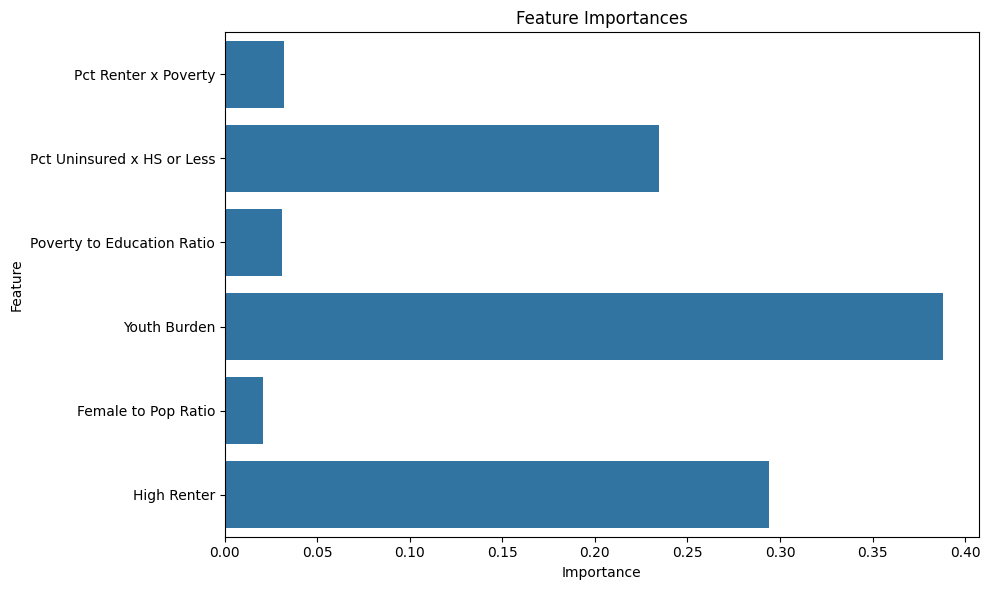

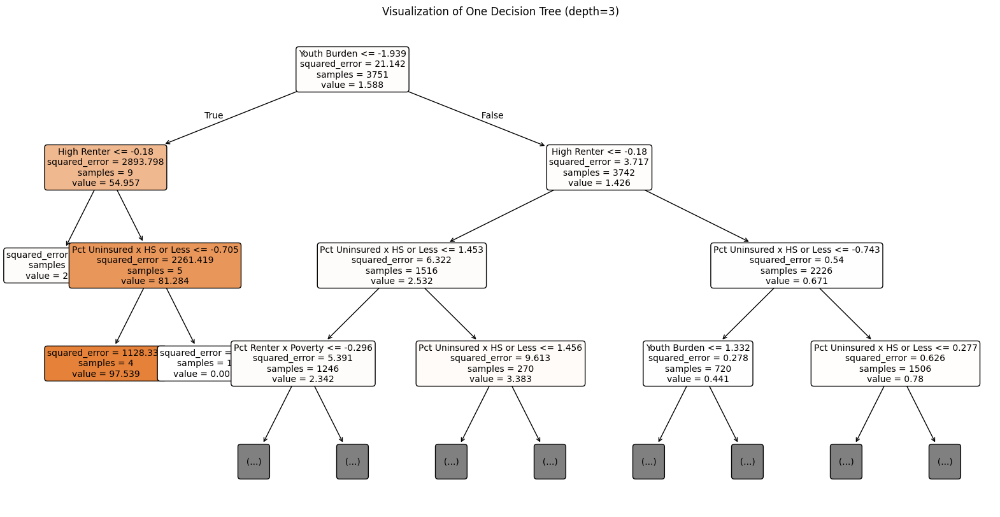

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import plot_tree
from sklearn.ensemble import RandomForestRegressor

# Asume que tienes un modelo ya entrenado
# model = RandomForestRegressor(...).fit(X_train, y_train)

# 1. IMPORTANCE OF FEATURES
importances = model.feature_importances_
feature_names = X_train.columns if hasattr(X_train, 'columns') else [f"feature_{i}" for i in range(len(importances))]

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=feature_names, orient="h")
plt.title("Feature Importances")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 2. VISUALIZE FIRST TREE IN FOREST
plt.figure(figsize=(20, 10))
plot_tree(model.estimators_[0],
          feature_names=feature_names,
          filled=True,
          rounded=True,
          max_depth=3,
          fontsize=10)
plt.title("Visualization of One Decision Tree (depth=3)")
plt.show()
